# Real-time Deep Learning Flood Mapping Demo

@ Author: Bo Peng (bo.peng@wisc.edu)

@ Spatial Computing and Data Mining Lab

@ University of Wisconsin - Madison

@ Project: Microsoft AI for Earth Project
 "Self-supervised deep learning and computer vision for
 real-time large-scale high-definition flood extent mapping"
 
@ Citation:
B. Peng et al., “Urban Flood Mapping With Bitemporal Multispectral
Imagery Via a Self-Supervised Learning Framework,”
IEEE J. Sel. Top. Appl. Earth Obs. Remote Sens., vol. 14, pp. 2001–2016, 2021.

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from osgeo import gdal, osr
from sklearn.utils import shuffle
from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_curve, precision_recall_fscore_support, jaccard_score, accuracy_score
from tqdm import tqdm
from PIL import ImageDraw, Image
from rsgis_utils import resize_image, RescaleImgIntesity
from scipy.misc import imresize
from skimage import measure, transform
from skimage import filters
from skimage import exposure
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, SpectralClustering
from sklearn import random_projection

## Set Matplotlib plot font

In [13]:
import matplotlib
# Say, "the default sans-serif font is COMIC SANS"
matplotlib.rcParams['font.serif'] = "Times New Roman"
# Then, "ALWAYS use sans-serif fonts"
matplotlib.rcParams['font.family'] = "serif"

# Load Pre + Post Flood Imagery

[ RASTER BAND COUNT ]:  4
253 10216
(1850, 3070, 4)
0.0 1.0


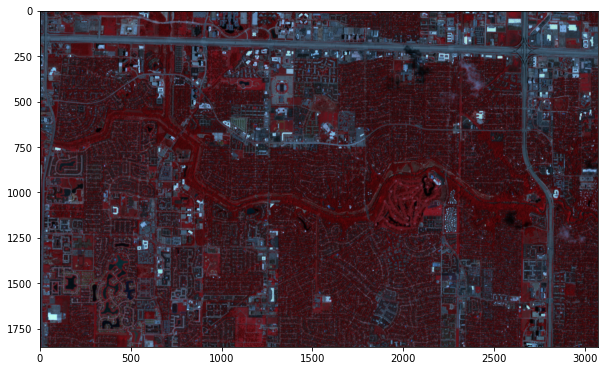

In [2]:
# read geotiff
img = gdal.Open("path to/planet_harvey_aoi03092020_0731.tif")

print("[ RASTER BAND COUNT ]: ", img.RasterCount)
img_np = []

for band in range( img.RasterCount ):
    band += 1
    srcband = img.GetRasterBand(band)
    if srcband is None:
        continue
        
    img_np.append(srcband.ReadAsArray())

img_np = np.array(img_np).transpose(1,2,0)
print(img_np.min(), img_np.max())
img_np = np.clip(img_np, 0, 10000)
height, width = img_np.shape[:2]
print(img_np.shape)

img_np_pre = img_np.copy()

img_rgb = RescaleImgIntesity(img_np[:,:,1:4][:,:,::-1], (0.0, 1.0))
print(img_rgb.min(), img_rgb.max())
img_rgb = np.clip(img_rgb, 0, 1)

plt.figure(figsize=(10,10))
plt.imshow(img_rgb)
plt.show()

del img
del img_np
del img_rgb

[ RASTER BAND COUNT ]:  4
img min/max 328.0 7334.0
(1850, 3070, 4)
0.0 1.0


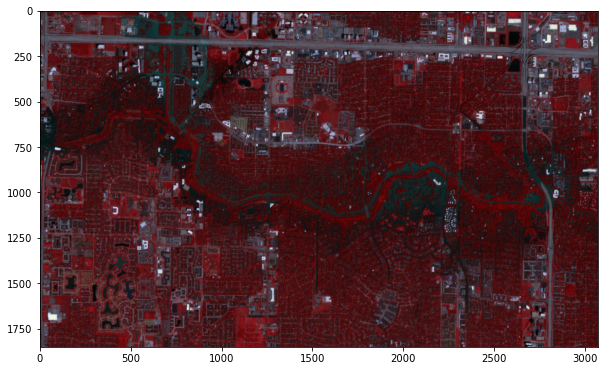

In [3]:
# read geotiff
img = gdal.Open("path to/planet_harvey_aoi03092020_0831.tif")

print("[ RASTER BAND COUNT ]: ", img.RasterCount)
img_np = []

for band in range( img.RasterCount ):
    band += 1
    srcband = img.GetRasterBand(band)
    if srcband is None:
        continue
        
    img_np.append(srcband.ReadAsArray())

img_np = np.array(img_np).transpose(1,2,0).astype(float)
print('img min/max', img_np.min(), img_np.max())
img_np = np.clip(img_np, 0, 10000)
height, width = img_np.shape[:2]
print(img_np.shape)

img_np_post = img_np.copy()

img_rgb = RescaleImgIntesity(img_np[:,:,1:4][:,:,::-1], (0.0, 1.0))
print(img_rgb.min(), img_rgb.max())
img_rgb = np.clip(img_rgb, 0, 1)

plt.figure(figsize=(10,10))
plt.imshow(img_rgb)
plt.show()

del img
del img_np
del img_rgb

# PCA

In [7]:
img_np_pre_rm = img_np_pre - np.mean(img_np_pre, axis=(0,1))
img_np_post_rm = img_np_post - np.mean(img_np_post, axis=(0,1))

img_np_pre_rm = np.reshape(img_np_pre_rm, (-1, 4))
img_np_post_rm = np.reshape(img_np_post_rm, (-1, 4))

pca = PCA(n_components=4)
img_np_pre_rm_pca = pca.fit_transform(img_np_pre_rm).reshape(img_np_pre.shape)
print(pca.singular_values_)

img_np_post_rm_pca = pca.fit_transform(img_np_post_rm).reshape(img_np_pre.shape)
print(pca.singular_values_)

[281.36527093 138.87571005  18.66677134  13.8339658 ]
[260.89814111 135.21571725  16.57831646  11.59590831]


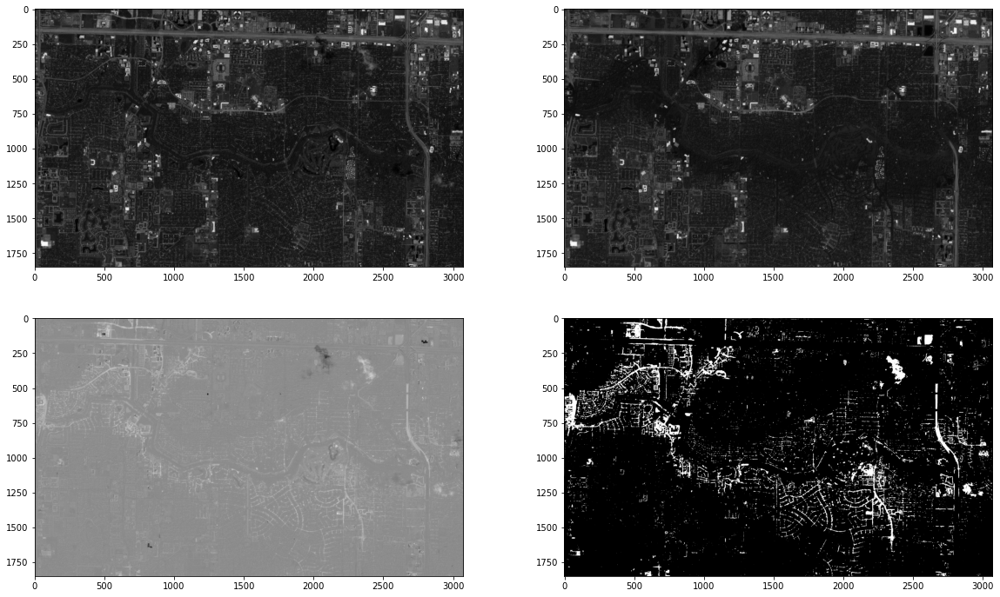

In [14]:
b = 0
diff = img_np_pre_rm_pca[:,:,b] - img_np_post_rm_pca[:,:,b]

plt.figure(figsize=(20,12))
plt.subplot(221)
plt.imshow(img_np_pre_rm_pca[:,:,b], cmap='gray')
plt.subplot(222)
plt.imshow(img_np_post_rm_pca[:,:,b], cmap='gray')
plt.subplot(223)
plt.imshow(diff, cmap='gray')
plt.subplot(224)
plt.imshow(diff>0.07, cmap='gray')

# Near Infrared Band

nir min/max: 0.0533 0.7334
nir min/max: 0.0533 0.7334


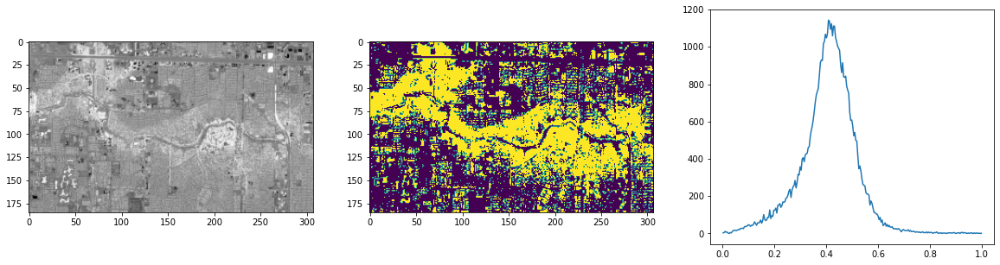

In [146]:
nir = img_np_post[:,:,-1]
print('nir min/max:', nir.min(), nir.max())
nir = np.clip(nir, 0, 0.8)
print('nir min/max:', nir.min(), nir.max())
nir = np.sqrt(nir)

nir = (nir - nir.min()) / (nir.max() - nir.min())

# resize to patch size
patch_nir = np.zeros((n_rows, n_cols))
for r in tqdm(range(n_rows)):
    for c in range(n_cols):
        patch_nir[r, c] = np.mean(nir[r*10:r*10+10, c*10:c*10+10])

patch_nir = (patch_nir - patch_nir.min()) / (patch_nir.max() - patch_nir.min())

hist, bin_centers = exposure.histogram(patch_nir, nbins=256)

plt.figure(figsize=(20,5))
plt.subplot(131)
plt.imshow(1-patch_nir, cmap='gray')
plt.subplot(132)
plt.imshow(patch_nir < 0.4)
plt.subplot(133)
plt.plot(bin_centers, hist)
plt.show()

# NDWI

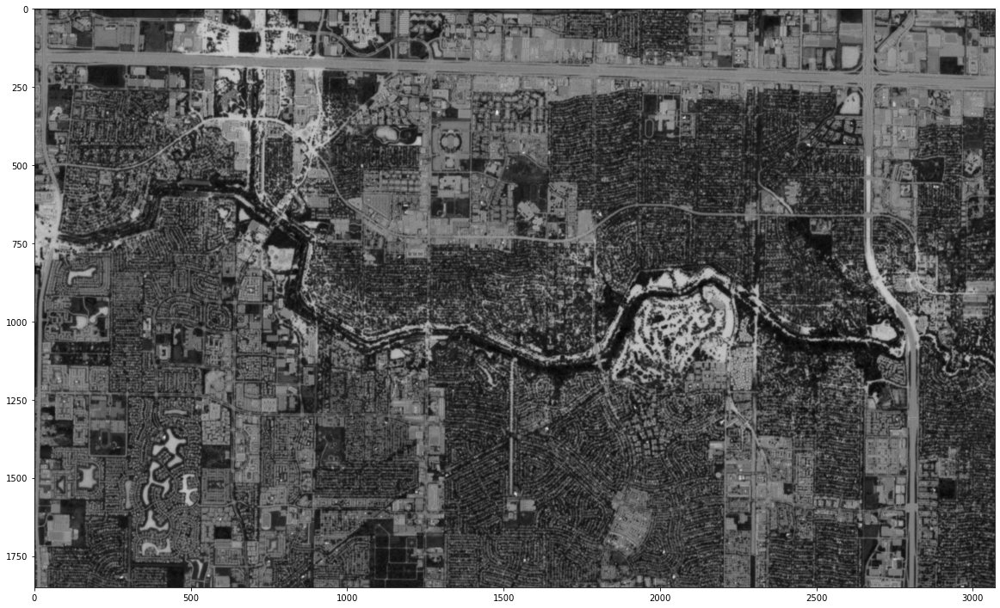

In [221]:
NDWI = (img_np_post[:,:,1] - img_np_post[:,:,3]) / (img_np_post[:,:,1] + img_np_post[:,:,3]) 
NDWI = (NDWI - NDWI.min()) / (NDWI.max() - NDWI.min())

plt.figure(figsize=(20,20))
plt.imshow(NDWI, cmap='gray')
plt.show()

In [39]:
x, y =  2380,608
g = img_np_post[y, x, 1]
nir = img_np_post[y, x, 3]
print(g, nir)
ndwi = (g-nir)/(g+nir)
print(ndwi)
ndwi = (1.0*(g-nir)/(g+nir) + 1) / 2
print(ndwi)

815.0 886.0
-0.041740152851263965
0.479129923574368


# Ground Truth Flood Map

In [4]:
floodmask_pil = Image.open('path to/planet_harvey_aoi03092020_0831_floodmask.tif')
floodmask_np = np.array(floodmask_pil)
print('width, height:', floodmask_pil.size)
print('height, width:', floodmask_np.shape)

width, height: (307, 185)
height, width: (185, 307)


int32
[0 1]


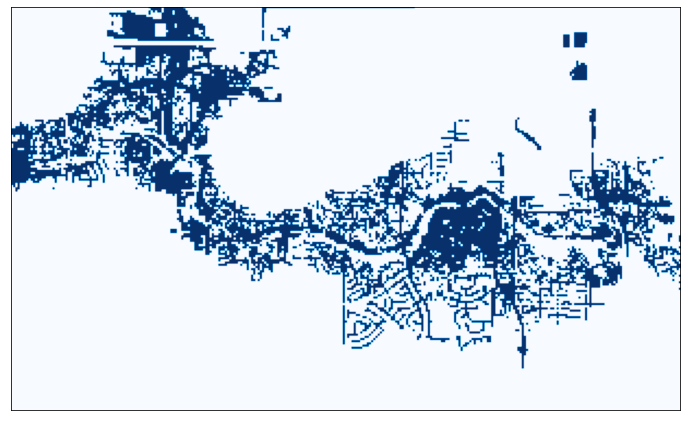

r_FL, n_FL: 0.1779029844176424 10104
r_NF, n_NF: 0.8220970155823576 46691


In [6]:
n_rows, n_cols = height//10, width//10
floodmask_gt_bin = (floodmask_np > 0).astype(np.int)
print(floodmask_gt_bin.dtype)
print(np.unique(floodmask_gt_bin))
plt.figure(figsize=(12,12))
plt.imshow(floodmask_gt_bin, cmap='Blues')
#plt.colorbar(fraction=0.03, pad=0.02)
plt.xticks([])
plt.yticks([])
plt.show()

# number of flooded / non-flooded patches
n_total = n_rows * n_cols
n_FL = np.sum(floodmask_gt_bin)
n_NF = n_total - n_FL

r_FL = n_FL / n_total
r_NF = n_NF / n_total

print('r_FL, n_FL:', r_FL, n_FL)
print('r_NF, n_NF:', r_NF, n_NF)

[ RASTER BAND COUNT ]:  3


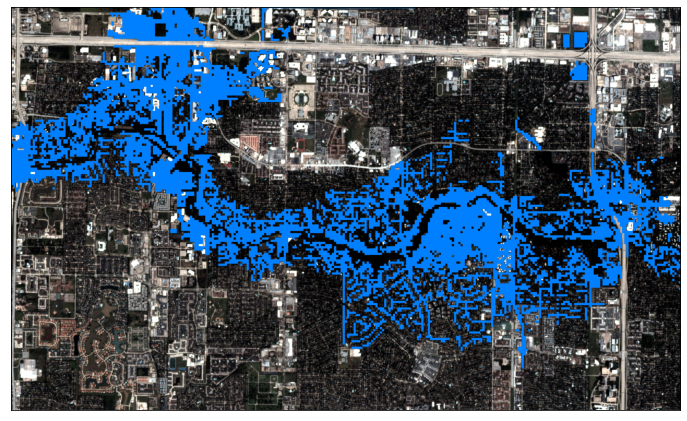

In [7]:
# overlay flood mask with image
img = gdal.Open("path to/planet_harvey_aoi03092020_0831_rgb.tif")
print("[ RASTER BAND COUNT ]: ", img.RasterCount)
img_np = []

for band in range( img.RasterCount ):
    band += 1
    srcband = img.GetRasterBand(band)
    if srcband is None:
        continue
        
    img_np.append(srcband.ReadAsArray())

img_np = np.array(img_np).transpose(1,2,0).astype(np.uint8)

img_post_rgb = img_np.copy()
del img_np
del img

for r in tqdm(range(n_rows)):
    for c in range(n_cols):
        if floodmask_gt_bin[r,c]:
            img_post_rgb[r*10:(r+1)*10, c*10:(c+1)*10] = [0, 128, 255]
    
plt.figure(figsize=(12,12))
plt.imshow(img_post_rgb)
#plt.colorbar(fraction=0.03, pad=0.02)
plt.xticks([])
plt.yticks([])
plt.show()

# Cloud Mask

pixel mask shape (1850, 3070)
pixel mask unique [0 1]
patch mask unique [0. 1.]
patch mask shape (185, 307)


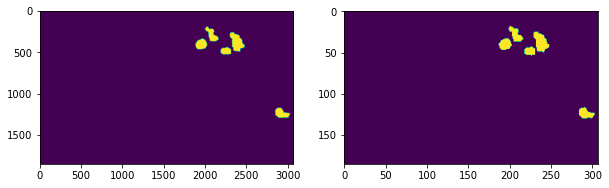

In [8]:
# read cloud mask
pixel_cloud_mask_tif = gdal.Open("../data/harvey/cloud_mask.tif")
srcband = pixel_cloud_mask_tif.GetRasterBand(1)
pixel_cloud_mask = srcband.ReadAsArray()
print('pixel mask shape', pixel_cloud_mask.shape)
print('pixel mask unique', np.unique(pixel_cloud_mask))

# patch wise cloud mask
patch_cloud_mask = np.zeros((n_rows, n_cols))
for r in range(n_rows):
    for c in range(n_cols):
        if np.any(pixel_cloud_mask[r*10: r*10+10, c*10:c*10+10]) > 0:
            patch_cloud_mask[r, c] = 1
        
print('patch mask unique', np.unique(patch_cloud_mask))
print('patch mask shape', np.shape(patch_cloud_mask))
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(pixel_cloud_mask)
plt.subplot(1,2,2)
plt.imshow(patch_cloud_mask)
plt.show()

# AutoEncoder-v2

In [96]:
src_dir = 'path to image feature codes'
code_cube_pre = np.load(src_dir+'/code_cube_pre.npy')
code_cube_post = np.load(src_dir+'/code_cube_post.npy')
assert code_cube_pre.shape == code_cube_post.shape

print('code cube shape', code_cube_post.shape)

code cube shape (185, 307, 64)


### Select cosine or l2

In [97]:
# cos-similarity
flood_response = np.zeros((n_rows, n_cols), dtype=float)
for r in tqdm(range(n_rows)):
    for c in range(n_cols):
        code_pxl_pre = code_cube_pre[r,c]
        code_pxl_post = code_cube_post[r,c]
        flood_response[r,c] = np.dot(code_pxl_pre, code_pxl_post) / (np.linalg.norm(code_pxl_pre)*np.linalg.norm(code_pxl_post))

flood_response = 1-flood_response
print(flood_response.shape)

100%|███████████████████████████████████████████████████████████████████████████████| 185/185 [00:00<00:00, 201.18it/s]


(185, 307)


In [327]:
# l2 distance of patch pairs
#flood_response = np.linalg.norm(code_cube_pre - code_cube_post, axis=2)
#print(flood_response.shape)

(185, 307)


# Thresholding to extract initial flooded regions

flood_response min/max: 0.00001862 / 0.13085992


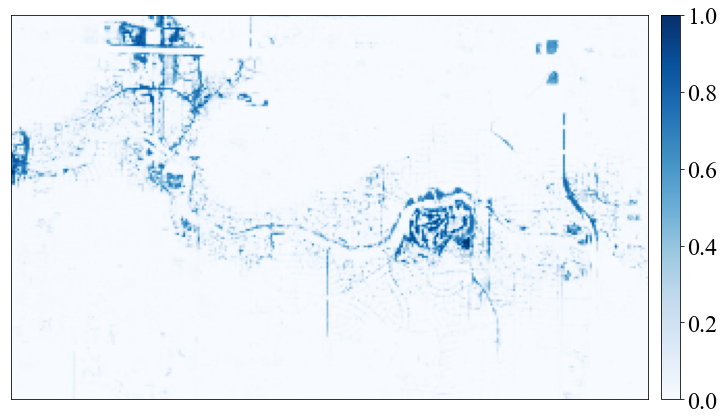

In [98]:
print('flood_response min/max: {:.8f} / {:.8f}'.format(flood_response.min(), flood_response.max()))
# normalize
flood_prob = (flood_response - flood_response.min()) / (flood_response.max() - flood_response.min())

# masking out cloud
flood_prob = np.ma.masked_array(flood_prob, patch_cloud_mask)
flood_prob = np.ma.filled(flood_prob, 0)

nbins=256
hist, bin_centers = exposure.histogram(flood_prob, nbins=nbins)
hist = hist / (n_rows*n_cols)

fig=plt.figure(figsize=(12,12))
plt.imshow(flood_prob, cmap='Blues')
plt.colorbar(fraction=0.0287, pad=0.02)
plt.rc('font', size=24) 
plt.xticks([])
plt.yticks([])

plt.show()

##  Thresholding - Corner

shift = 0
optimal th = 0.029296875
ratio FL:  0.18258649529007837
precision, recall, F1: 0.8939247830279653, 0.917458432304038, 0.9055387320504054
IoU: 0.8273830774723313
OA: 0.9659477066643191


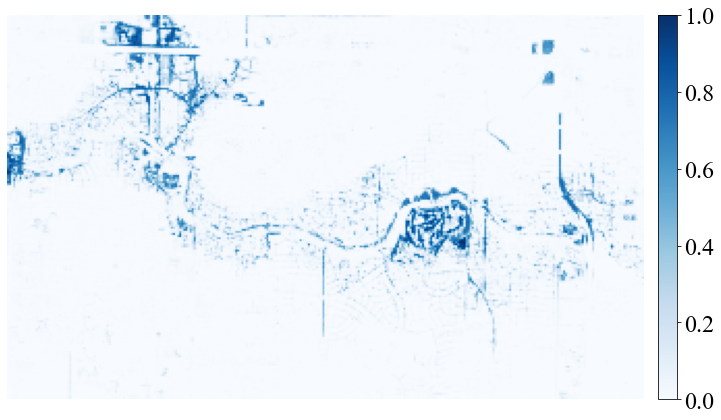

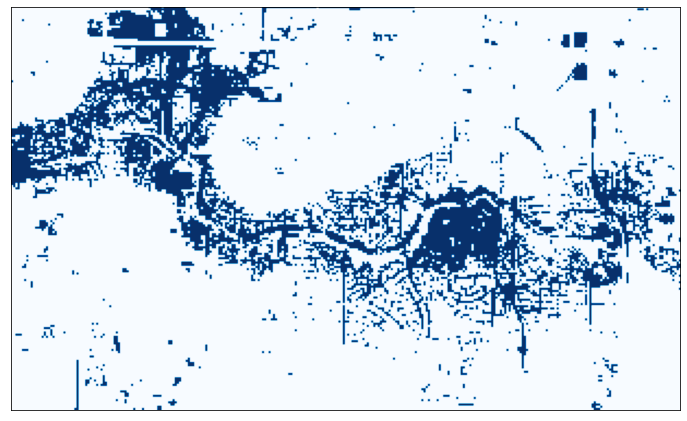

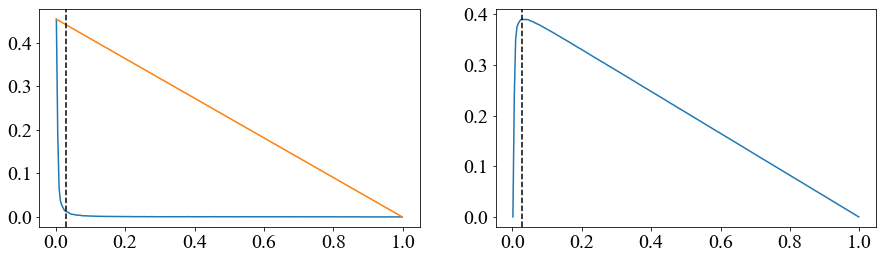

In [99]:
# corner thresholding
argmax_hist = np.argmax(hist)
back = 0
x = (bin_centers[argmax_hist], bin_centers[nbins-1 - back])
y = (hist[argmax_hist], hist[nbins-1 - back])
a = (y[1]-y[0]) / (x[1]- x[0]) # slope
b = -a*x[0] + y[0] # intercept

dist = []
for i in range(argmax_hist, nbins- back):
    _x = bin_centers[i]
    _y = hist[i]
    d = np.abs(a*_x - _y + b) / np.sqrt(a**2 + 1)
    dist.append(d)
    
hist = np.array(hist)
dist = np.array(dist)

argmax_dist = np.argmax(dist)

shift = 0
sigma = 0.0 # 2% shift
while np.abs(dist[argmax_dist] - dist[argmax_dist-shift]) <= sigma * dist[argmax_dist]:
    shift += 1
shift -= 1 # shift back 1 step

print('shift =', shift)

th = bin_centers[argmax_hist + argmax_dist-shift]
print('optimal th =', th)

flood_map = (flood_prob >= th).astype(np.int)
print('ratio FL: ', np.sum(flood_map) / (n_rows*n_cols))

# precision, recall, f1 
prc, rec, f1, _ = precision_recall_fscore_support(floodmask_gt_bin.flatten(), flood_map.flatten(), average='binary')
print('precision, recall, F1: {}, {}, {}'.format(prc, rec, f1))

# IoU or Jaccard Index
iou = jaccard_score(floodmask_gt_bin.flatten(), flood_map.flatten(), average='binary')
print('IoU: {}'.format(iou))

# Overall Accuracy
oa = accuracy_score(floodmask_gt_bin.flatten(), flood_map.flatten())
print('OA: {}'.format(oa))

fig=plt.figure(figsize=(12,12))
plt.imshow(flood_prob, cmap='Blues')
plt.colorbar(fraction=0.0287, pad=0.02)
plt.rc('font', size=20) 
plt.axis('off')
plt.show()

fig=plt.figure(figsize=(12,12))
plt.imshow(flood_map, cmap='Blues')
#plt.colorbar(fraction=0.03, pad=0.02)
plt.rc('font', size=20) 
plt.xticks([])
plt.yticks([])
plt.show()

plt.figure(figsize=(15,4))
plt.subplot(1,2,1)
plt.plot(bin_centers, hist, x, y)
plt.axvline(th, color='k', ls='--')
plt.subplot(1,2,2)
plt.plot(bin_centers[argmax_hist:nbins-back], dist)
plt.axvline(th, color='k', ls='--')
plt.show()

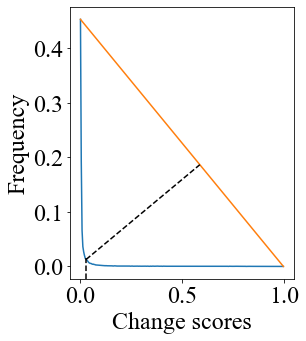

In [95]:
# draw a figure demo for corner thresholding

zidx = 150
zx = [th, bin_centers[zidx]]
zy = [hist[argmax_hist + argmax_dist-shift], a*bin_centers[zidx]+b]

plt.figure(figsize=(4,5))
#plt.subplot(1,2,1)
plt.plot(bin_centers, hist, x, y,  zx, zy, 'k--')
plt.axvline(th, ymax=0.075, color='k', ls='--')
plt.xlabel('Change scores')
plt.ylabel('Frequency')
plt.rc('font', size=24) 

plt.show()

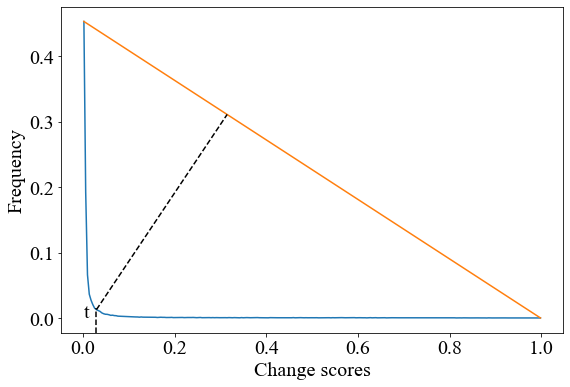

In [74]:
# for figure in paper demo of corner thresholding

# draw a figure demo for corner thresholding

zidx = 80
zx = [th, bin_centers[zidx]]
zy = [hist[argmax_hist + argmax_dist-shift], a*bin_centers[zidx]+b]

plt.figure(figsize=(9,6))
#plt.subplot(1,2,1)
plt.plot(bin_centers, hist, x, y,  zx, zy, 'k--')
plt.axvline(th, ymax=0.075, color='k', ls='--')
plt.xlabel('Change scores')
plt.ylabel('Frequency')
plt.rc('font', size=20) 

plt.text(0.001,0.001, 't')
plt.show()

## Thresholding - Otsu 

optimal th = 0.275390625
ratio FL:  0.051694691434105114
precision, recall, F1: 0.9969346049046321, 0.2896872525732383, 0.4489263803680981
IoU: 0.28942944724611885
OA: 0.8734747777093054


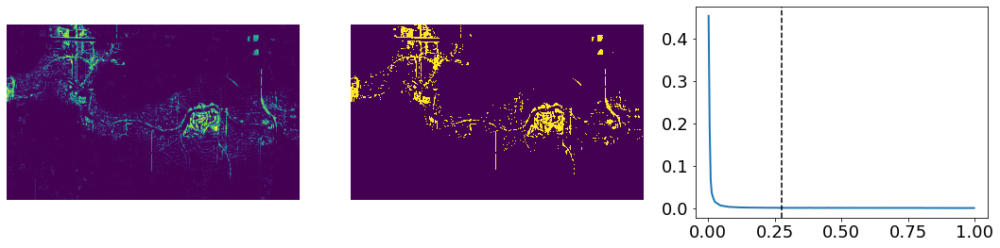

In [584]:
th = filters.threshold_otsu(flood_prob)
print('optimal th =', th)

flood_map = (flood_prob >= th).astype(np.int)
print('ratio FL: ', np.sum(flood_map) / (n_rows*n_cols))

# precision, recall, f1 
prc, rec, f1, _ = precision_recall_fscore_support(floodmask_gt_bin.flatten(), flood_map.flatten(), average='binary')
print('precision, recall, F1: {}, {}, {}'.format(prc, rec, f1))

# IoU or Jaccard Index
iou = jaccard_score(floodmask_gt_bin.flatten(), flood_map.flatten(), average='binary')
print('IoU: {}'.format(iou))

# Overall Accuracy
oa = accuracy_score(floodmask_gt_bin.flatten(), flood_map.flatten())
print('OA: {}'.format(oa))

plt.figure(figsize=(15, 4))
plt.subplot(131)
plt.imshow(flood_prob, interpolation='nearest')
plt.axis('off')
plt.subplot(132)
plt.imshow(flood_map, interpolation='nearest')
plt.axis('off')
plt.subplot(133)
plt.plot(bin_centers, hist, lw=2)
plt.axvline(th, color='k', ls='--')

plt.tight_layout()
plt.show()

## Thresholding - Min error thresholding

optimal th = 2
ratio FL:  0.287190773835725
precision, recall, F1: 0.615351603212556, 0.993368962787015, 0.7599469998107137
IoU: 0.6128342899010868
OA: 0.8883528479619685


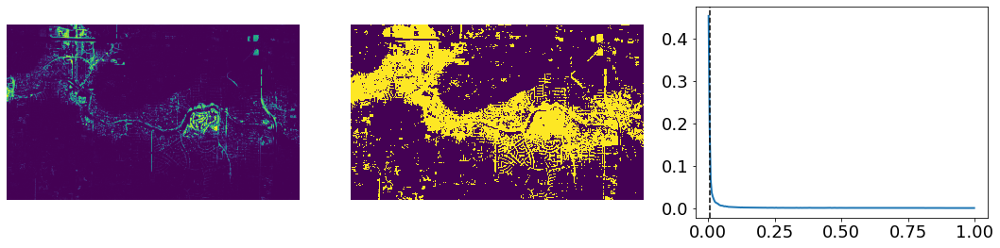

In [585]:
from min_err import min_err_threshold

flood_prob_255 = (flood_prob * 255).astype(int)
th = min_err_threshold(flood_prob_255)
print('optimal th =', th)

flood_map = (flood_prob_255 > th).astype(np.int)
print('ratio FL: ', np.sum(flood_map) / (n_rows*n_cols))

# precision
prc, rec, f1, _ = precision_recall_fscore_support(floodmask_gt_bin.flatten(), flood_map.flatten(), average='binary')
print('precision, recall, F1: {}, {}, {}'.format(prc, rec, f1))

# IoU or Jaccard Index
iou = jaccard_score(floodmask_gt_bin.flatten(), flood_map.flatten(), average='binary')
print('IoU: {}'.format(iou))

# Overall Accuracy
oa = accuracy_score(floodmask_gt_bin.flatten(), flood_map.flatten())
print('OA: {}'.format(oa))

plt.figure(figsize=(15, 4))
plt.subplot(131)
plt.imshow(flood_prob_255, interpolation='nearest')
plt.axis('off')
plt.subplot(132)
plt.imshow(flood_map, interpolation='nearest')
plt.axis('off')
plt.subplot(133)
plt.plot(bin_centers, hist, lw=2)
plt.axvline(th / 255.0, color='k', ls='--')

plt.tight_layout()
plt.show()

# TP, FP, FN demo map - Initial thresholding

  0%|                                                                                          | 0/185 [00:00<?, ?it/s]

# FN: 834
# FP: 1100


100%|██████████████████████████████████████████████████████████████████████████████| 185/185 [00:00<00:00, 1149.07it/s]


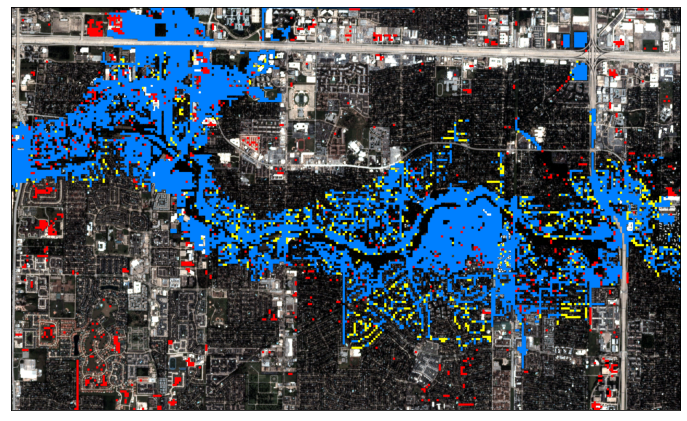

In [22]:
TP = flood_map & floodmask_gt_bin
FP = flood_map ^ TP
FN = floodmask_gt_bin ^ TP

print('# FN:', np.sum(FN))
print('# FP:', np.sum(FP))

floodmap_demo = np.ones((height, width, 3), dtype=np.uint8) * 255

for r in tqdm(range(n_rows)):
    for c in range(n_cols):
        if TP[r,c]:
            #floodmap_demo[r,c] = [0, 76, 153]
            floodmap_demo[r*10:(r+1)*10, c*10:(c+1)*10] = [0, 128, 255]
        elif FP[r,c]:
            floodmap_demo[r*10:(r+1)*10, c*10:(c+1)*10] = [255, 0, 0]
        elif FN[r,c]:
            floodmap_demo[r*10:(r+1)*10, c*10:(c+1)*10] = [255, 255, 0]
        else:
            floodmap_demo[r*10:(r+1)*10, c*10:(c+1)*10] = img_post_rgb[r*10:(r+1)*10, c*10:(c+1)*10]

fig=plt.figure(figsize=(12,12))
plt.imshow(floodmap_demo, cmap='Blues')
#plt.colorbar(fraction=0.03, pad=0.02)
plt.rc('font', size=18) 
plt.xticks([])
plt.yticks([])
plt.show()

# Pixel Flood Map

100%|█████████████████████████████████████████████████████████████████████████████| 185/185 [00:00<00:00, 10275.94it/s]


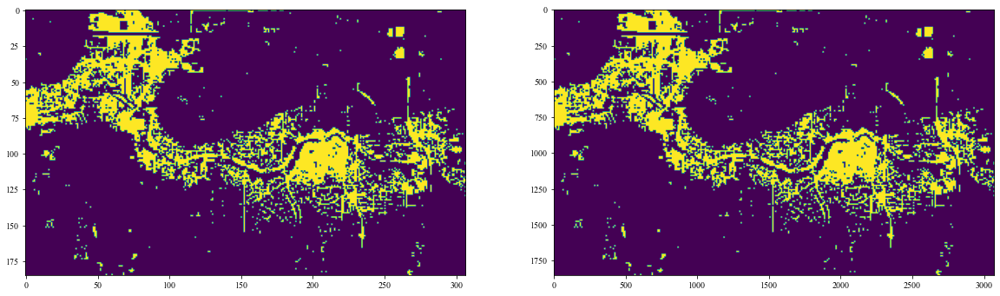

In [35]:
flood_map_pxl = np.zeros((height, width), dtype=bool)
for r in tqdm(range(n_rows)):
    for c in range(n_cols):
        if flood_map[r,c]:
            flood_map_pxl[r*10:(r+1)*10, c*10:(c+1)*10] = 1
            
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(flood_map)
plt.subplot(122)
plt.imshow(flood_map_pxl)

# Spectral Filtering

### Clustering

#### Note that every run of kmeans clustering may produce slightly different results

In [24]:
n_sel = np.sum(flood_map_pxl)
pxls_trn = np.zeros((n_sel, 4), dtype=float)

c = 0
for i in tqdm(range(height)):
    for j in range(width):
        if flood_map_pxl[i,j]:
            pxls_trn[c] = img_np_post[i,j]
            c += 1

100%|████████████████████████████████████████████████████████████████████████████| 1850/1850 [00:01<00:00, 1024.36it/s]


In [25]:
from sklearn import cluster

kmeans = cluster.KMeans(n_clusters=2, n_init=10, max_iter=300).fit(pxls_trn)
#cl = cluster.SpectralClustering(n_clusters=3, assign_labels="discretize").fit(pxls_trn)

flood_map_pxl_cluster = np.zeros((height, width), dtype=np.uint8)
c=0
for i in tqdm(range(height)):
    for j in range(width):
        if flood_map_pxl[i,j]:
            flood_map_pxl_cluster[i,j] = kmeans.labels_[c] + 1
            c += 1

100%|████████████████████████████████████████████████████████████████████████████| 1850/1850 [00:01<00:00, 1154.07it/s]


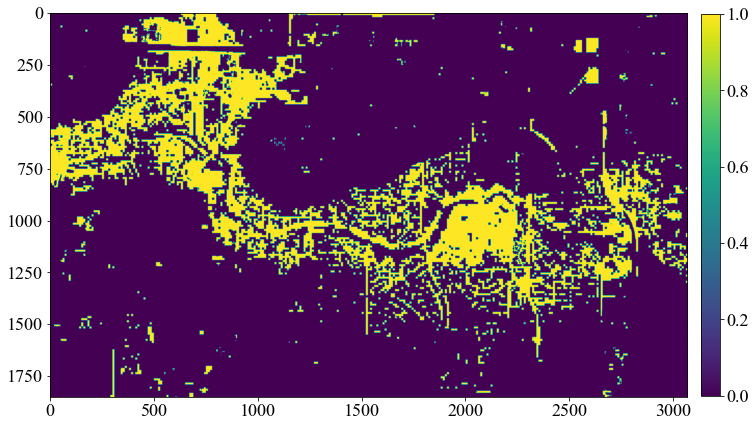

pred map unique: [0 1 2]
pred map dtype uint8


In [26]:
fb=2 # class corresponding to floodwater
plt.figure(figsize=(12,12))
plt.imshow(flood_map_pxl_cluster == fb)
plt.colorbar(fraction=0.0285, pad=0.02)
plt.show()

print('pred map unique:', np.unique(flood_map_pxl_cluster))
print('pred map dtype', flood_map_pxl_cluster.dtype)

flood_map_pxl_cluster_fw_bldg = (flood_map_pxl_cluster == fb)# floodwater and buildings

### building maks

(1850, 3070)


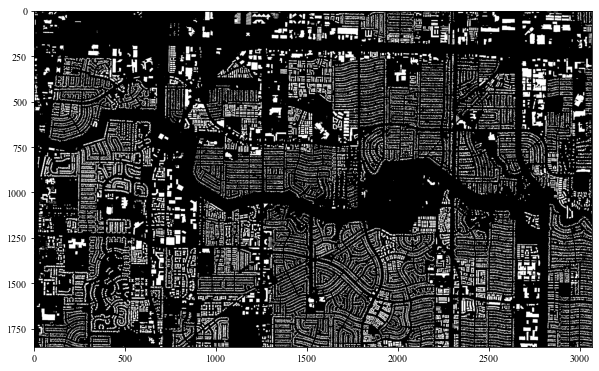

In [46]:
# read geotiff
img = gdal.Open("path to/planet_harvey_aoi03092020_bldg_microsoft.tif")

bands = img.RasterCount
assert bands == 1

srcband = img.GetRasterBand(1)
img_np = srcband.ReadAsArray()
height, width = img_np.shape
print(img_np.shape)

building_fp = img_np.copy()
del img_np

plt.figure(figsize=(10,10))
plt.imshow(building_fp < 65535, cmap='gray')
plt.rc('font', size=10) 
plt.show()

bldg = building_fp < 65535 # buildings

### Filter out buildings, get the flood map after spectral filtering, evaluate results

100%|███████████████████████████████████████████████████████████████████████████████| 185/185 [00:00<00:00, 864.50it/s]


precision, recall, F1: 0.925869432580842, 0.9011282660332541, 0.9133313271140535
IoU: 0.8404873996122958
OA: 0.9695747865128973


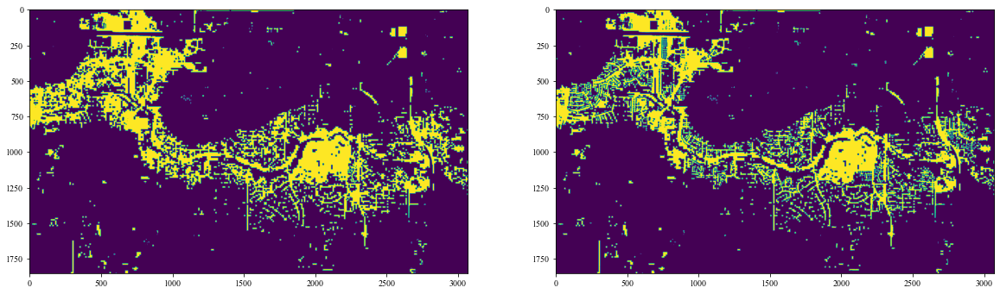

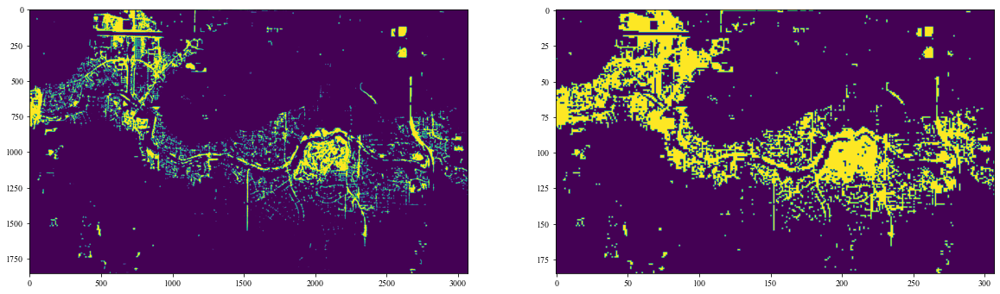

In [50]:
flood_map_pxl_cluster_fw = flood_map_pxl_cluster_fw_bldg ^ (flood_map_pxl_cluster_fw_bldg & bldg) # only floodwaters

plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(flood_map_pxl_cluster_fw_bldg)
plt.subplot(122)
plt.imshow(flood_map_pxl_cluster_fw)

flood_map_patch_fw = np.zeros_like(flood_map) # patches containing floodwater (fw)
for r in tqdm(range(n_rows)):
    for c in range(n_cols):
        if np.any(flood_map_pxl_cluster_fw[r*10:(r+1)*10, c*10:(c+1)*10]):
            flood_map_patch_fw[r,c] = 1

plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(flood_map_pxl_cluster_fw)
plt.subplot(122)
plt.imshow(flood_map_patch_fw)

flood_map = flood_map_patch_fw.copy()

# precision, recall, f1 
prc, rec, f1, _ = precision_recall_fscore_support(floodmask_gt_bin.flatten(), flood_map.flatten(), average='binary')
print('precision, recall, F1: {}, {}, {}'.format(prc, rec, f1))

# IoU or Jaccard Index
iou = jaccard_score(floodmask_gt_bin.flatten(), flood_map.flatten(), average='binary')
print('IoU: {}'.format(iou))

# Overall Accuracy
oa = accuracy_score(floodmask_gt_bin.flatten(), flood_map.flatten())
print('OA: {}'.format(oa))

# Retrieve floodmap after spectral filtering via demo floodmaps (TP, FP, FN)

100%|███████████████████████████████████████████████████████████████████████████████| 185/185 [00:00<00:00, 880.95it/s]


precision, recall, F1: 0.920498753117207, 0.9133016627078385, 0.916886084753341
IoU: 0.8465278414824328
OA: 0.9705431816181002


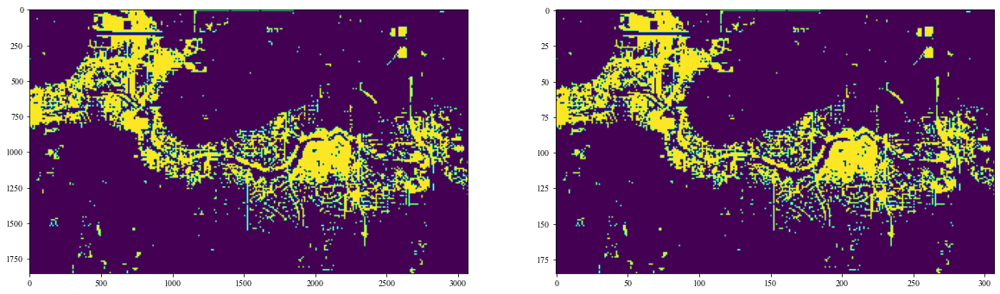

In [52]:
floodmap_demo_pil = Image.open('path to/planet_harvey_aoi03092020_08312018_patch_floodmap_TP_FP_FN_cl.tif')
floodmap_demo = np.array(floodmap_demo_pil)

flood_map_pxl_cluster_fw = np.zeros((height, width))
for r in tqdm(range(n_rows)):
    for c in range(n_cols):
        if np.all(floodmap_demo[r*10:(r+1)*10, c*10:(c+1)*10] == [0, 128, 255]) or \
        np.all(floodmap_demo[r*10:(r+1)*10, c*10:(c+1)*10] == [255, 0, 0]):
            flood_map_pxl_cluster_fw[r*10:(r+1)*10, c*10:(c+1)*10] = 1
            
# write to file
flood_map_pxl_cluster_fw_pil = Image.fromarray(flood_map_pxl_cluster_fw)
flood_map_pxl_cluster_fw_pil.save('path to/planet_harvey_aoi03092020_08312018_patch_flood_map_pxl_cluster_fw.tif')
            
flood_map_patch_fw = np.zeros_like(flood_map) # patches containing floodwater (fw)
for r in tqdm(range(n_rows)):
    for c in range(n_cols):
        if np.any(flood_map_pxl_cluster_fw[r*10:(r+1)*10, c*10:(c+1)*10]):
            flood_map_patch_fw[r,c] = 1

plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(flood_map_pxl_cluster_fw)
plt.subplot(122)
plt.imshow(flood_map_patch_fw)

flood_map = flood_map_patch_fw.copy()

# precision, recall, f1 
prc, rec, f1, _ = precision_recall_fscore_support(floodmask_gt_bin.flatten(), flood_map.flatten(), average='binary')
print('precision, recall, F1: {}, {}, {}'.format(prc, rec, f1))

# IoU or Jaccard Index
iou = jaccard_score(floodmask_gt_bin.flatten(), flood_map.flatten(), average='binary')
print('IoU: {}'.format(iou))

# Overall Accuracy
oa = accuracy_score(floodmask_gt_bin.flatten(), flood_map.flatten())
print('OA: {}'.format(oa))

# TP, FP, FN demo - after spectral clustering

100%|██████████████████████████████████████████████████████████████████████████████| 185/185 [00:00<00:00, 1360.32it/s]

# FN: 835
# FP: 1059


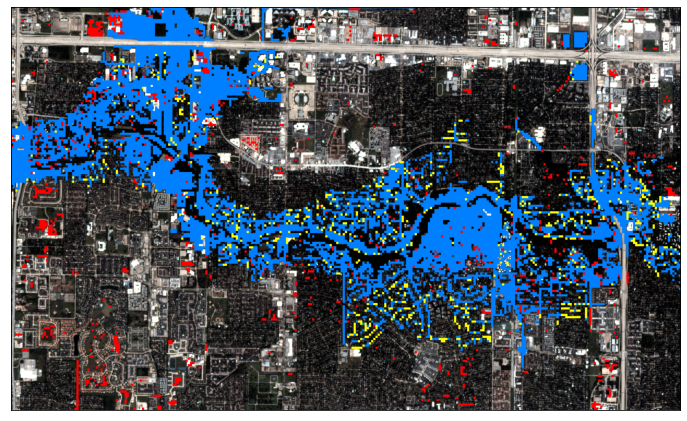

In [29]:
TP = flood_map & floodmask_gt_bin
FP = flood_map ^ TP
FN = floodmask_gt_bin ^ TP

print('# FN:', np.sum(FN))
print('# FP:', np.sum(FP))

floodmap_demo = np.ones((height, width, 3), dtype=np.uint8) * 255

for r in tqdm(range(n_rows)):
    for c in range(n_cols):
        if TP[r,c]:
            #floodmap_demo[r,c] = [0, 76, 153]
            floodmap_demo[r*10:(r+1)*10, c*10:(c+1)*10] = [0, 128, 255]
        elif FP[r,c]:
            floodmap_demo[r*10:(r+1)*10, c*10:(c+1)*10] = [255, 0, 0]
        elif FN[r,c]:
            floodmap_demo[r*10:(r+1)*10, c*10:(c+1)*10] = [255, 255, 0]
        else:
            floodmap_demo[r*10:(r+1)*10, c*10:(c+1)*10] = img_post_rgb[r*10:(r+1)*10, c*10:(c+1)*10]

fig=plt.figure(figsize=(12,12))
plt.imshow(floodmap_demo, cmap='Blues')
#plt.colorbar(fraction=0.03, pad=0.02)
#plt.rc('font', size=18) 
plt.xticks([])
plt.yticks([])
plt.show()


# Spatial filtering

## Floodwater connectivity and remove small flooded regions
## Run one of the above "thresholding" first

  0%|                                                                                          | 0/185 [00:00<?, ?it/s]

# of regions before connection except background: 438
# of regions before connection: 439


100%|████████████████████████████████████████████████████████████████████████████████| 185/185 [00:02<00:00, 81.46it/s]


# of regions after connection: 71


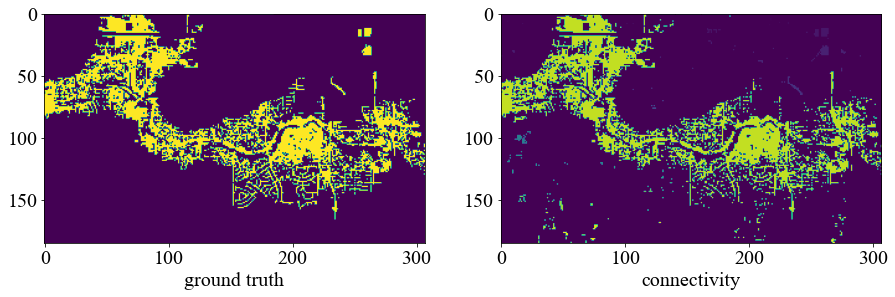

# of label values before removing small regions: 71


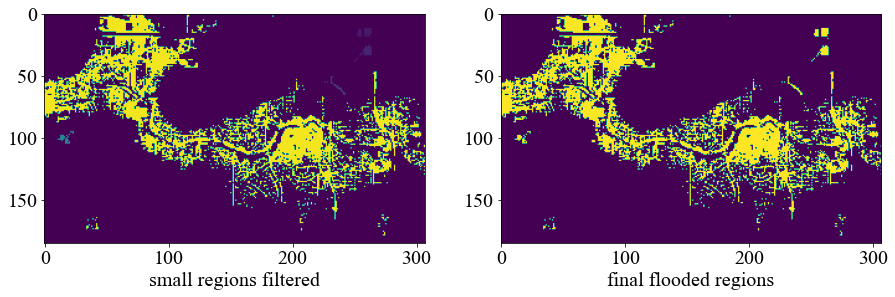

# of label values after removing small regions: 8
precision, recall, F1: 0.942769545222279, 0.9130047505938242, 0.927648448891347
IoU: 0.865060015003751
OA: 0.9746632626111453


In [110]:
flood_map = flood_map_patch_fw.copy()

# floodwater connectivity
flood_map_cnt, n_label = measure.label(flood_map, connectivity=2, return_num =True)
print('# of regions before connection except background:', n_label)
print('# of regions before connection:', np.unique(flood_map_cnt).size)

###########################################################
# scan to connect near regions
buf = 5 # buffer patches
for r in tqdm(range(n_rows)):
    for c in range(n_cols):
        # scan local circle
        if flood_map_cnt[r,c] > 0:
            for i in range(r-buf, r+buf+1):
                for j in range(c-buf, c+buf+1):
                    if i>=0 and i<n_rows and j>=0 and j<n_cols and (i-r)**2+(j-c)**2<=buf**2 \
                    and flood_map_cnt[i,j] > 0 and flood_map_cnt[r,c] != flood_map_cnt[i,j]:
                        lb_cur = flood_map_cnt[r,c]
                        lb_near = flood_map_cnt[i,j]
                        flood_map_cnt = np.ma.masked_array(flood_map_cnt, flood_map_cnt==lb_near)
                        flood_map_cnt = np.ma.filled(flood_map_cnt, lb_cur)

print('# of regions after connection:', np.unique(flood_map_cnt).size)

plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.imshow(floodmask_gt_bin)
plt.xlabel('ground truth')
plt.subplot(1,2,2)
plt.imshow(flood_map_cnt)
plt.xlabel('connectivity')
plt.show()
###########################################################

# remove small regions
label_vals = np.unique(flood_map_cnt)
print('# of label values before removing small regions:', len(label_vals))

wt = 20
for lb in label_vals[1:]:
    if np.sum(flood_map_cnt == lb) < wt:
        np.place(flood_map_cnt, flood_map_cnt==lb, [0])

plt.figure(figsize=(15,10))
plt.subplot(121)
plt.imshow(flood_map_cnt)
plt.xlabel('small regions filtered')
plt.subplot(122)
plt.imshow(flood_map_cnt>0)
plt.xlabel('final flooded regions')
plt.show()

label_vals = np.unique(flood_map_cnt)
print('# of label values after removing small regions:', len(label_vals))

flood_map = flood_map_cnt>0

# precision, recall, f1 
prc, rec, f1, _ = precision_recall_fscore_support(floodmask_gt_bin.flatten(), flood_map.flatten(), average='binary')
print('precision, recall, F1: {}, {}, {}'.format(prc, rec, f1))

# IoU or Jaccard Index
iou = jaccard_score(floodmask_gt_bin.flatten(), flood_map.flatten(), average='binary')
print('IoU: {}'.format(iou))

# Overall Accuracy
oa = accuracy_score(floodmask_gt_bin.flatten(), flood_map.flatten())
print('OA: {}'.format(oa))

# TP, FP, FN demo map - after spatial filtering

100%|██████████████████████████████████████████████████████████████████████████████| 185/185 [00:00<00:00, 1581.18it/s]

# FN: 879
# FP: 560


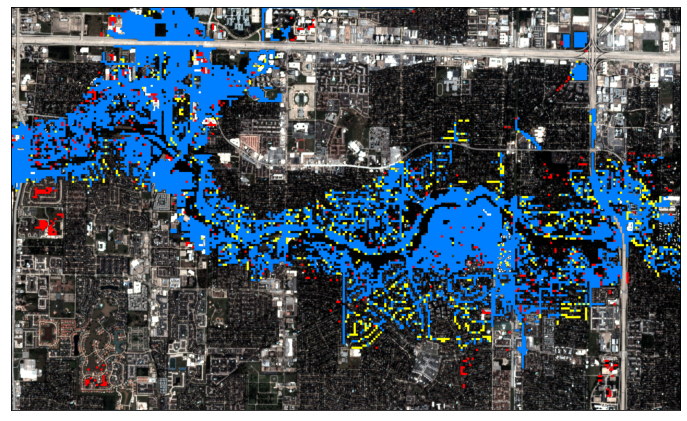

In [56]:
TP = flood_map & floodmask_gt_bin
FP = flood_map ^ TP
FN = floodmask_gt_bin ^ TP

print('# FN:', np.sum(FN))
print('# FP:', np.sum(FP))

floodmap_demo = np.ones((height, width, 3), dtype=np.uint8) * 255

for r in tqdm(range(n_rows)):
    for c in range(n_cols):
        if TP[r,c]:
            #floodmap_demo[r,c] = [0, 76, 153]
            floodmap_demo[r*10:(r+1)*10, c*10:(c+1)*10] = [0, 128, 255]
        elif FP[r,c]:
            floodmap_demo[r*10:(r+1)*10, c*10:(c+1)*10] = [255, 0, 0]
        elif FN[r,c]:
            floodmap_demo[r*10:(r+1)*10, c*10:(c+1)*10] = [255, 255, 0]
        else:
            floodmap_demo[r*10:(r+1)*10, c*10:(c+1)*10] = img_post_rgb[r*10:(r+1)*10, c*10:(c+1)*10]

fig=plt.figure(figsize=(12,12))
plt.imshow(floodmap_demo, cmap='Blues')
#plt.colorbar(fraction=0.03, pad=0.02)
#plt.rc('font', size=18) 
plt.xticks([])
plt.yticks([])
plt.show()